In [1]:
import os, sys
parent_dir = os.path.abspath('..')
if not parent_dir in sys.path:
    sys.path.append(parent_dir)

In [2]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from ultralytics import YOLO
import ultralytics
ultralytics.checks()
from lib.images import list_images

Ultralytics YOLOv8.1.4 🚀 Python-3.11.5 torch-2.1.2 CPU (Apple M2 Max)
Setup complete ✅ (12 CPUs, 64.0 GB RAM, 52.7/1858.2 GB disk)


In [3]:
model = YOLO("runs/detect/train/weights/best.pt")

In [4]:
model.info()

Model summary: 225 layers, 3011628 parameters, 0 gradients, 8.2 GFLOPs


(225, 3011628, 0, 8.197376)

In [5]:
def get_bounding_boxes(results):
    bb = []
    index = 0
    for box in results[0].boxes:
        class_name = results[0].names[box.cls.int().item()]
        bb.append((class_name, box.xyxy[0], box.conf.item()))
        index += 1
    return bb

def detect_objects(image_path, ax):
    results = model(image_path)

    image = Image.open(image_path)
    ax.imshow(image)

    # Create a rectangle patch and label for each bounding box
    edgecolors = ['r', 'g', 'b', 'y', 'm', 'c']
    i = 0
    for class_name, box, conf in get_bounding_boxes(results):
        edgecolor = edgecolors[i % len(edgecolors)]
        print(f"{class_name}: {conf:.2f} ({edgecolor})")
        rect = patches.Rectangle((box[0], box[1]), box[2]-box[0], box[3]-box[1], linewidth=1, edgecolor=edgecolor, facecolor='none')
        ax.text(box[0], box[1], class_name, color='white', fontsize=8)
        ax.add_patch(rect)
        i += 1


image 1/1 /Users/mellio/object-detection-face-mask/yolov8/../images-yolo/test/mm-24.jpg: 736x736 2 medical-masks, 71.7ms
Speed: 3.3ms preprocess, 71.7ms inference, 0.9ms postprocess per image at shape (1, 3, 736, 736)
medical-mask: 0.95 (r)
medical-mask: 0.65 (g)


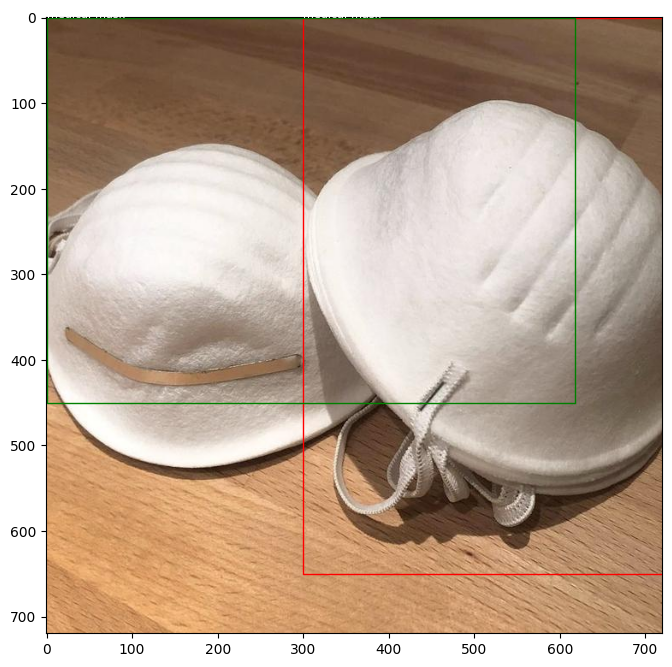


image 1/1 /Users/mellio/object-detection-face-mask/yolov8/../images-yolo/test/mm-26.jpg: 736x736 2 medical-masks, 93.4ms
Speed: 11.7ms preprocess, 93.4ms inference, 0.5ms postprocess per image at shape (1, 3, 736, 736)
medical-mask: 0.51 (r)
medical-mask: 0.46 (g)


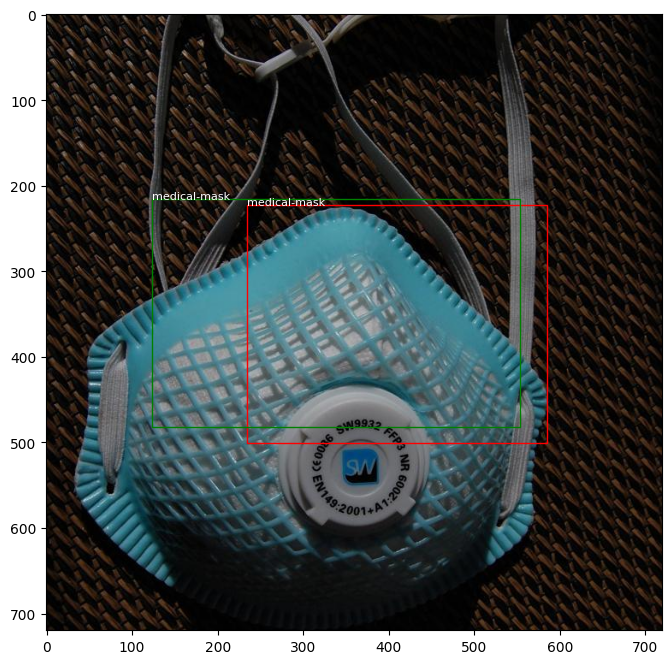


image 1/1 /Users/mellio/object-detection-face-mask/yolov8/../images-yolo/test/pm-21.jpg: 736x736 1 medical-mask, 1 person-mask, 77.8ms
Speed: 2.4ms preprocess, 77.8ms inference, 0.6ms postprocess per image at shape (1, 3, 736, 736)
person-mask: 0.98 (r)
medical-mask: 0.35 (g)


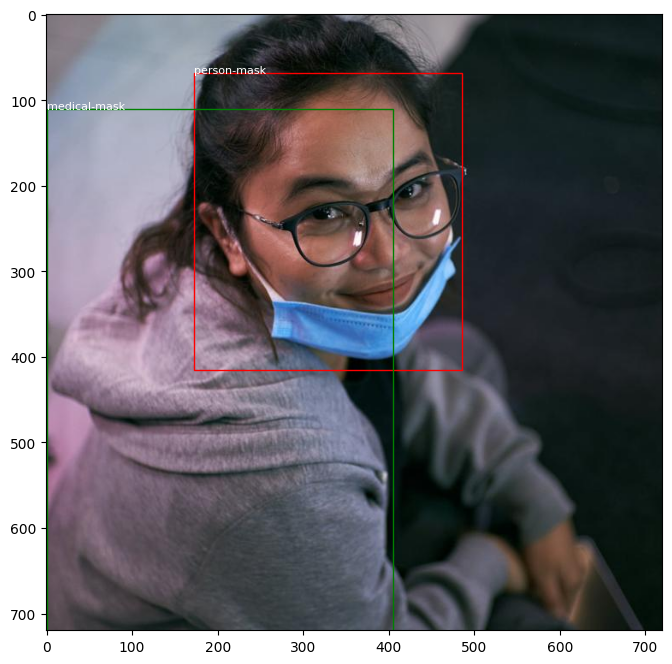


image 1/1 /Users/mellio/object-detection-face-mask/yolov8/../images-yolo/test/pm-19.jpg: 736x736 1 person-mask, 70.0ms
Speed: 2.4ms preprocess, 70.0ms inference, 0.4ms postprocess per image at shape (1, 3, 736, 736)
person-mask: 0.27 (r)


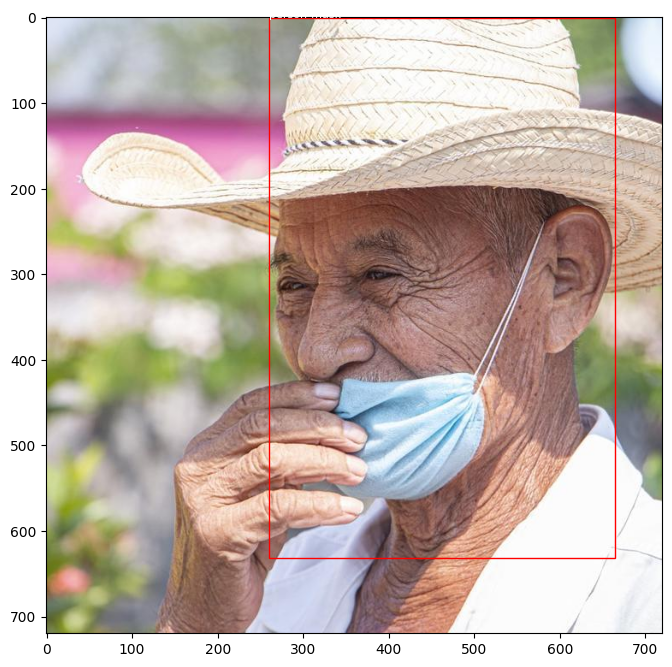


image 1/1 /Users/mellio/object-detection-face-mask/yolov8/../images-yolo/test/pmn-1.jpg: 736x736 1 medical-mask, 81.1ms
Speed: 2.5ms preprocess, 81.1ms inference, 0.5ms postprocess per image at shape (1, 3, 736, 736)
medical-mask: 0.75 (r)


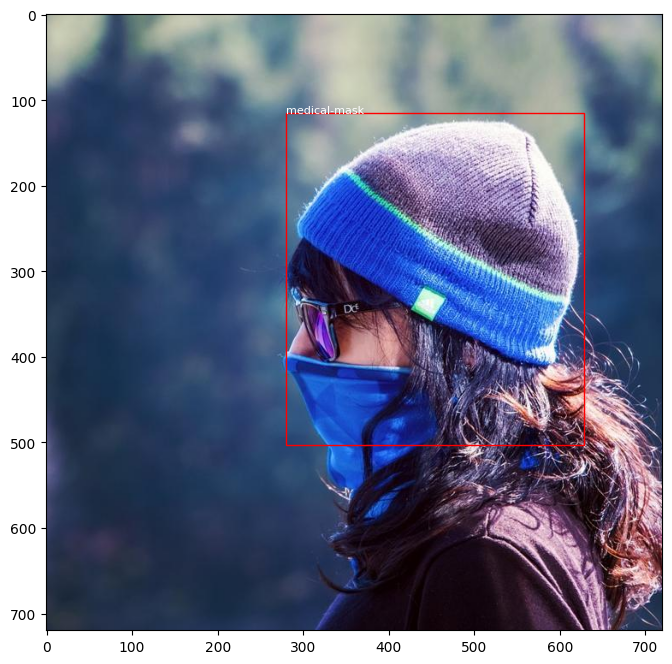


image 1/1 /Users/mellio/object-detection-face-mask/yolov8/../images-yolo/test/pm-26.jpg: 736x736 1 medical-mask, 2 person-masks, 74.5ms
Speed: 2.3ms preprocess, 74.5ms inference, 0.6ms postprocess per image at shape (1, 3, 736, 736)
person-mask: 0.81 (r)
person-mask: 0.54 (g)
medical-mask: 0.31 (b)


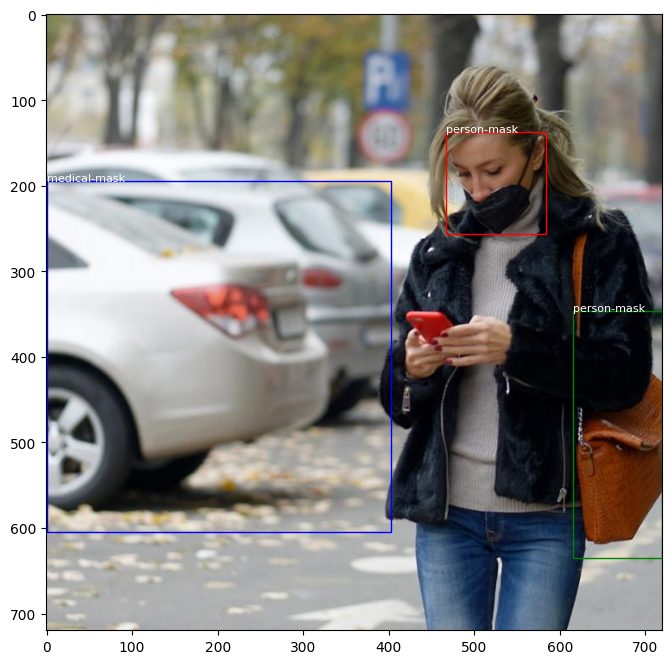


image 1/1 /Users/mellio/object-detection-face-mask/yolov8/../images-yolo/test/pmn-17.jpg: 736x736 1 person-mask, 84.8ms
Speed: 2.5ms preprocess, 84.8ms inference, 0.5ms postprocess per image at shape (1, 3, 736, 736)
person-mask: 0.28 (r)


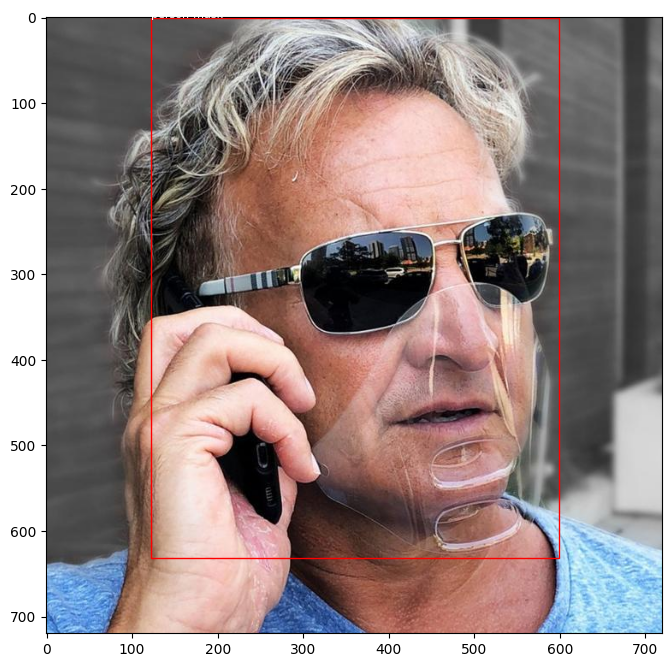


image 1/1 /Users/mellio/object-detection-face-mask/yolov8/../images-yolo/test/mm-21.jpg: 736x736 2 medical-masks, 65.8ms
Speed: 2.5ms preprocess, 65.8ms inference, 0.6ms postprocess per image at shape (1, 3, 736, 736)
medical-mask: 0.94 (r)
medical-mask: 0.51 (g)


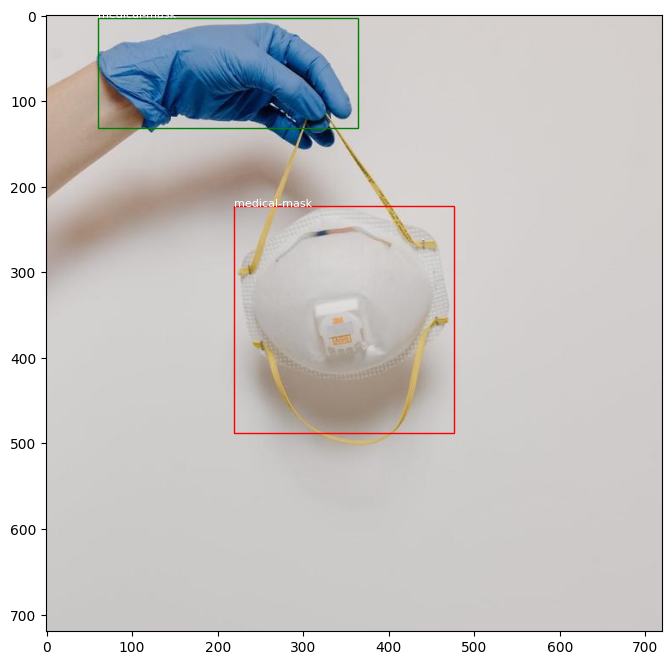


image 1/1 /Users/mellio/object-detection-face-mask/yolov8/../images-yolo/test/pm-33.jpg: 736x736 1 medical-mask, 2 person-masks, 81.4ms
Speed: 2.3ms preprocess, 81.4ms inference, 0.6ms postprocess per image at shape (1, 3, 736, 736)
person-mask: 0.84 (r)
person-mask: 0.81 (g)
medical-mask: 0.28 (b)


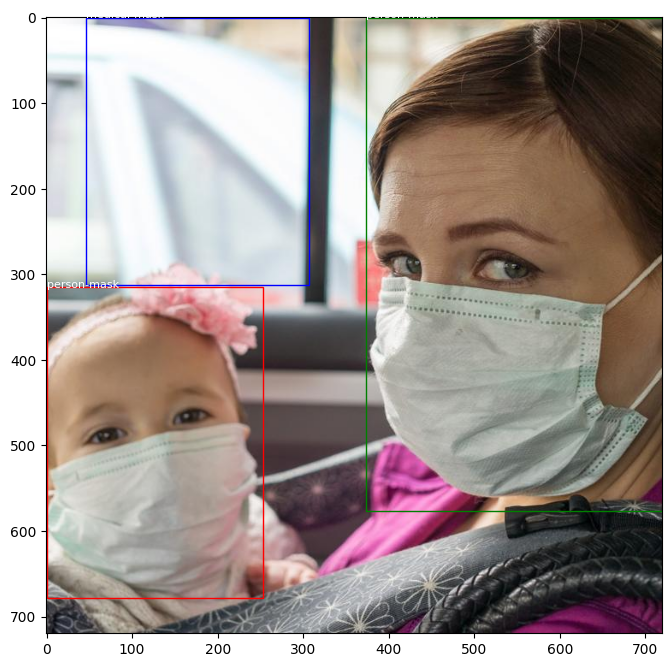


image 1/1 /Users/mellio/object-detection-face-mask/yolov8/../images-yolo/test/mm-1.jpg: 736x736 7 medical-masks, 67.0ms
Speed: 2.5ms preprocess, 67.0ms inference, 0.5ms postprocess per image at shape (1, 3, 736, 736)
medical-mask: 0.88 (r)
medical-mask: 0.54 (g)
medical-mask: 0.50 (b)
medical-mask: 0.36 (y)
medical-mask: 0.33 (m)
medical-mask: 0.31 (c)
medical-mask: 0.27 (r)


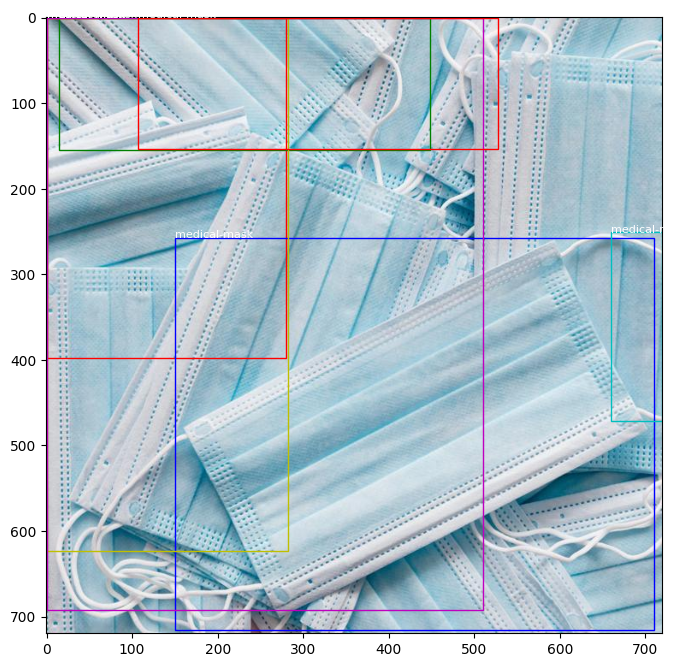


image 1/1 /Users/mellio/object-detection-face-mask/yolov8/../images-yolo/test/pmm-21.jpg: 736x736 1 person-masked-medical, 80.6ms
Speed: 2.4ms preprocess, 80.6ms inference, 0.5ms postprocess per image at shape (1, 3, 736, 736)
person-masked-medical: 0.44 (r)


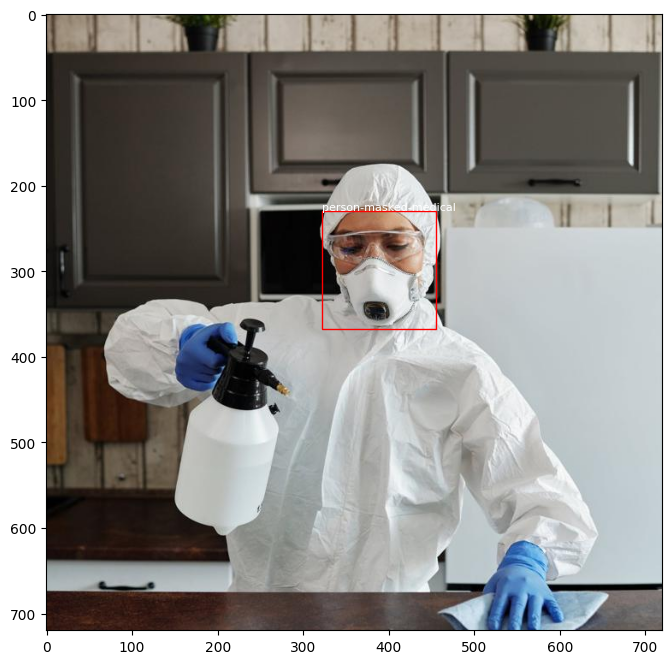


image 1/1 /Users/mellio/object-detection-face-mask/yolov8/../images-yolo/test/pmm-1.jpg: 736x736 1 person-mask, 74.9ms
Speed: 2.4ms preprocess, 74.9ms inference, 0.5ms postprocess per image at shape (1, 3, 736, 736)
person-mask: 0.58 (r)


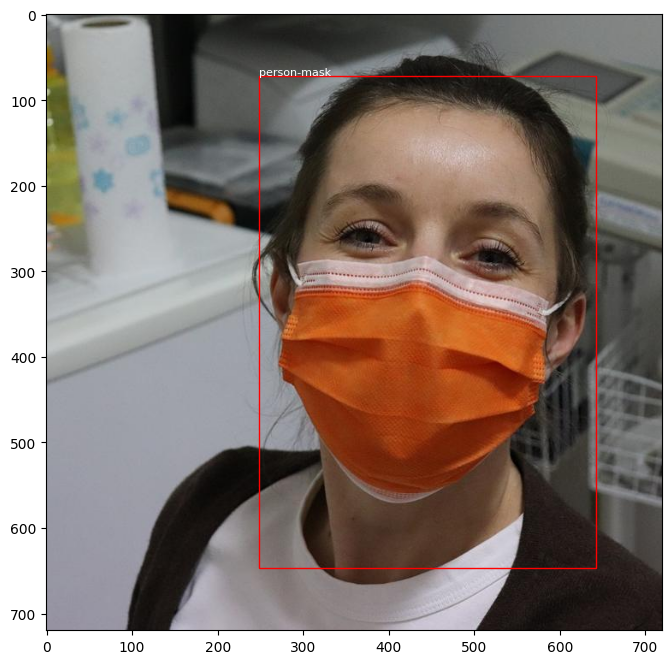


image 1/1 /Users/mellio/object-detection-face-mask/yolov8/../images-yolo/test/pmm-24.jpg: 736x736 2 medical-masks, 1 person-masked-medical, 83.7ms
Speed: 2.3ms preprocess, 83.7ms inference, 0.7ms postprocess per image at shape (1, 3, 736, 736)
person-masked-medical: 0.87 (r)
medical-mask: 0.49 (g)
medical-mask: 0.40 (b)


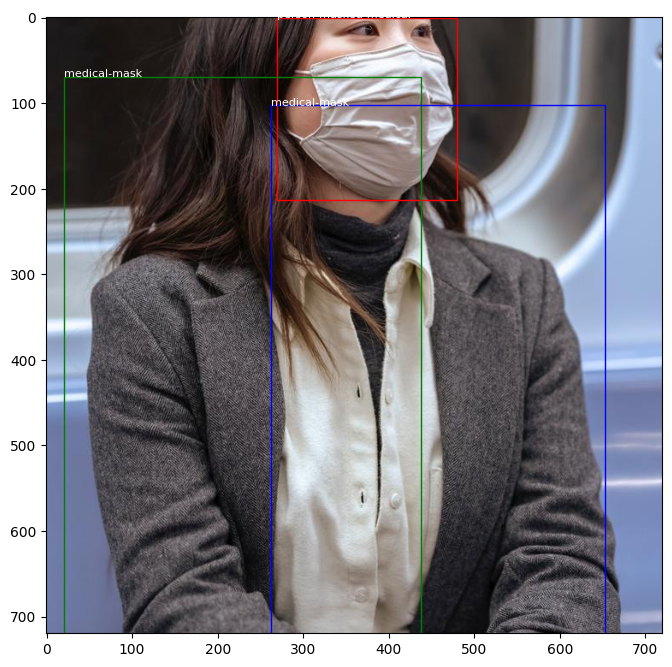


image 1/1 /Users/mellio/object-detection-face-mask/yolov8/../images-yolo/test/pm-6.jpg: 736x736 (no detections), 84.8ms
Speed: 2.5ms preprocess, 84.8ms inference, 0.4ms postprocess per image at shape (1, 3, 736, 736)


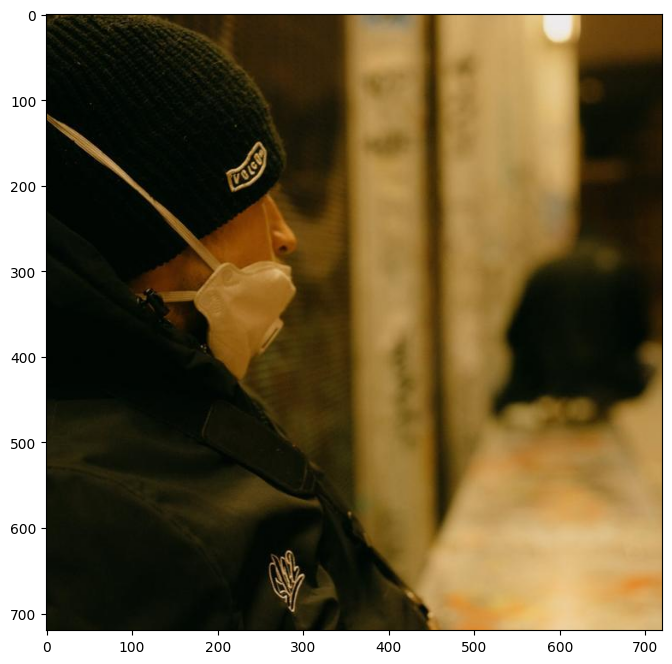


image 1/1 /Users/mellio/object-detection-face-mask/yolov8/../images-yolo/test/pmm-17.jpg: 736x736 2 person-masked-medicals, 81.3ms
Speed: 2.4ms preprocess, 81.3ms inference, 0.8ms postprocess per image at shape (1, 3, 736, 736)
person-masked-medical: 0.96 (r)
person-masked-medical: 0.77 (g)


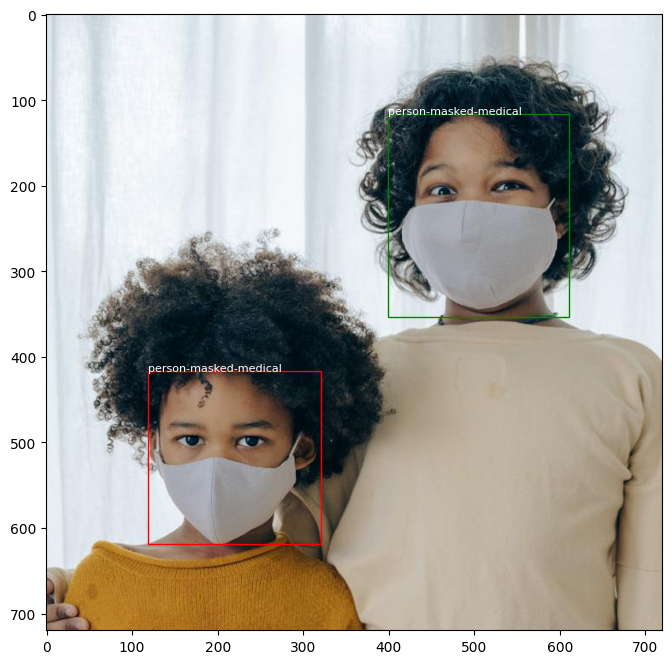


image 1/1 /Users/mellio/object-detection-face-mask/yolov8/../images-yolo/test/pmm-9.jpg: 736x736 1 person-masked-medical, 94.5ms
Speed: 2.4ms preprocess, 94.5ms inference, 0.4ms postprocess per image at shape (1, 3, 736, 736)
person-masked-medical: 0.27 (r)


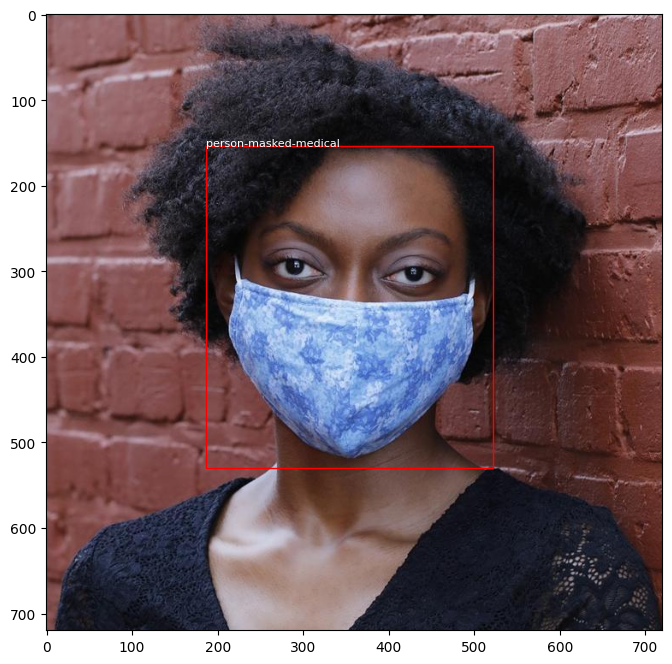


image 1/1 /Users/mellio/object-detection-face-mask/yolov8/../images-yolo/test/pm-16.jpg: 736x736 1 medical-mask, 1 person-mask, 81.4ms
Speed: 2.5ms preprocess, 81.4ms inference, 0.6ms postprocess per image at shape (1, 3, 736, 736)
person-mask: 0.75 (r)
medical-mask: 0.36 (g)


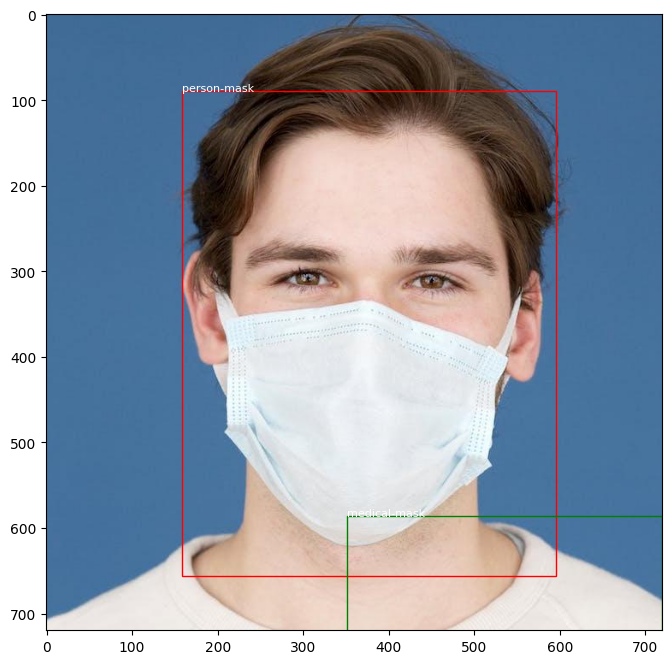


image 1/1 /Users/mellio/object-detection-face-mask/yolov8/../images-yolo/test/pmn-24.jpg: 736x736 3 medical-masks, 1 person-mask, 67.6ms
Speed: 2.4ms preprocess, 67.6ms inference, 0.5ms postprocess per image at shape (1, 3, 736, 736)
medical-mask: 0.53 (r)
medical-mask: 0.34 (g)
person-mask: 0.34 (b)
medical-mask: 0.31 (y)


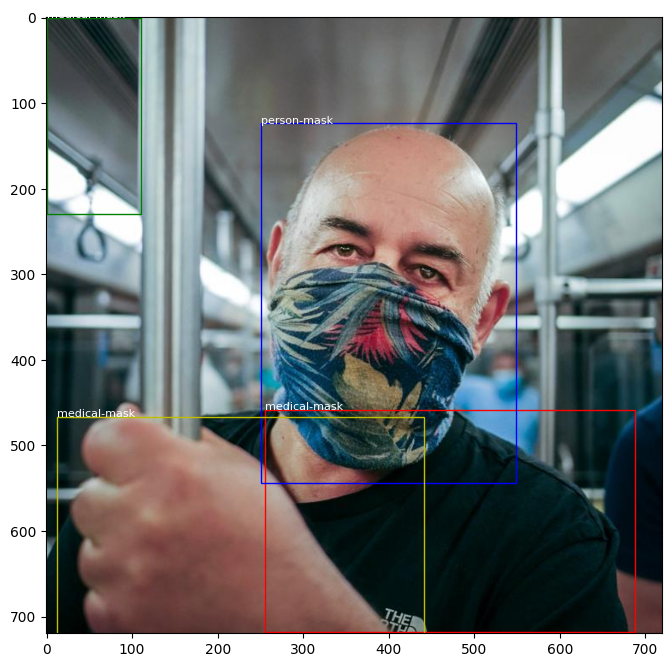


image 1/1 /Users/mellio/object-detection-face-mask/yolov8/../images-yolo/test/pm-28.jpg: 736x736 4 person-masks, 92.5ms
Speed: 2.2ms preprocess, 92.5ms inference, 0.9ms postprocess per image at shape (1, 3, 736, 736)
person-mask: 0.94 (r)
person-mask: 0.92 (g)
person-mask: 0.79 (b)
person-mask: 0.38 (y)


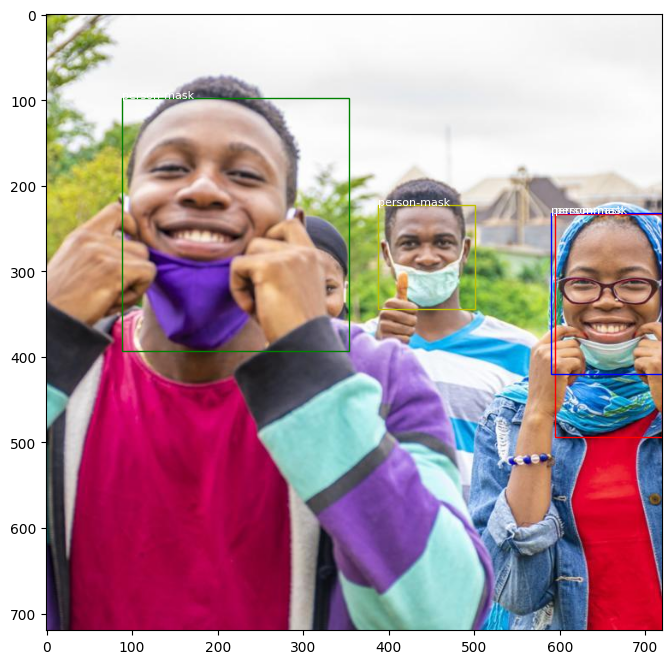


image 1/1 /Users/mellio/object-detection-face-mask/yolov8/../images-yolo/test/pmn-21.jpg: 736x736 1 person-mask, 89.8ms
Speed: 2.3ms preprocess, 89.8ms inference, 0.5ms postprocess per image at shape (1, 3, 736, 736)
person-mask: 0.65 (r)


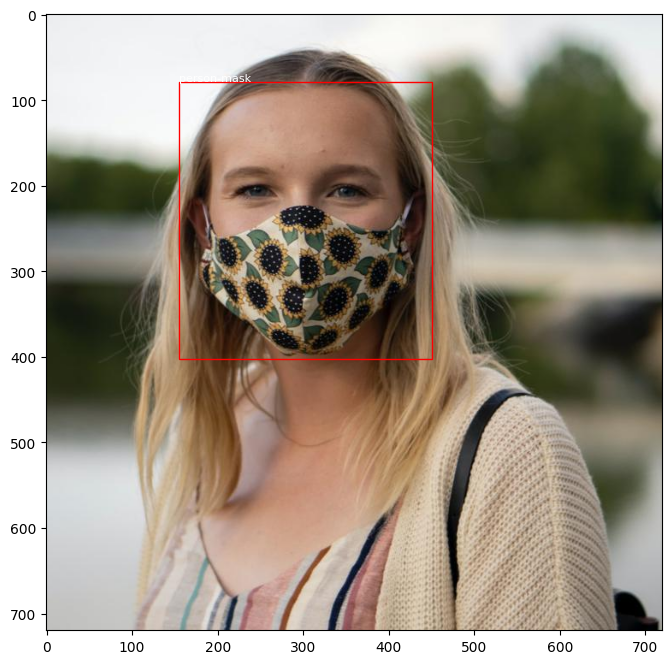


image 1/1 /Users/mellio/object-detection-face-mask/yolov8/../images-yolo/test/pmn-9.jpg: 736x736 (no detections), 97.1ms
Speed: 2.5ms preprocess, 97.1ms inference, 0.4ms postprocess per image at shape (1, 3, 736, 736)


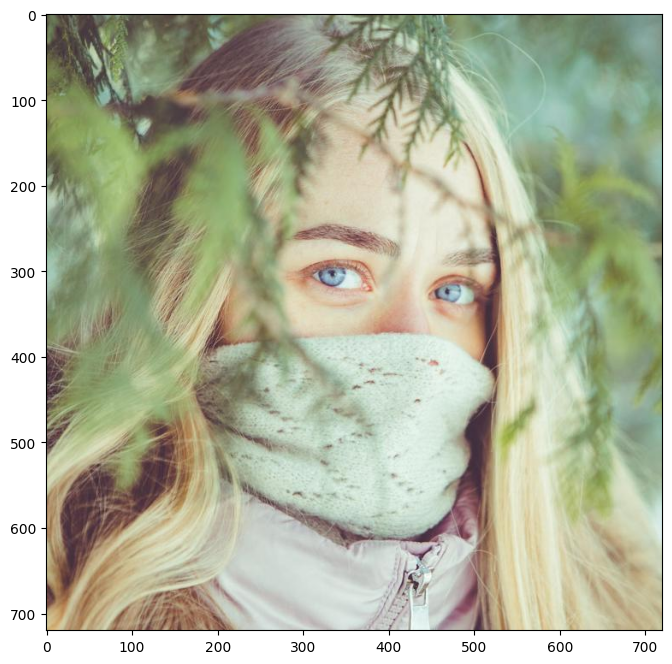


image 1/1 /Users/mellio/object-detection-face-mask/yolov8/../images-yolo/test/mm-17.jpg: 736x736 3 medical-masks, 75.6ms
Speed: 2.5ms preprocess, 75.6ms inference, 0.6ms postprocess per image at shape (1, 3, 736, 736)
medical-mask: 0.94 (r)
medical-mask: 0.92 (g)
medical-mask: 0.88 (b)


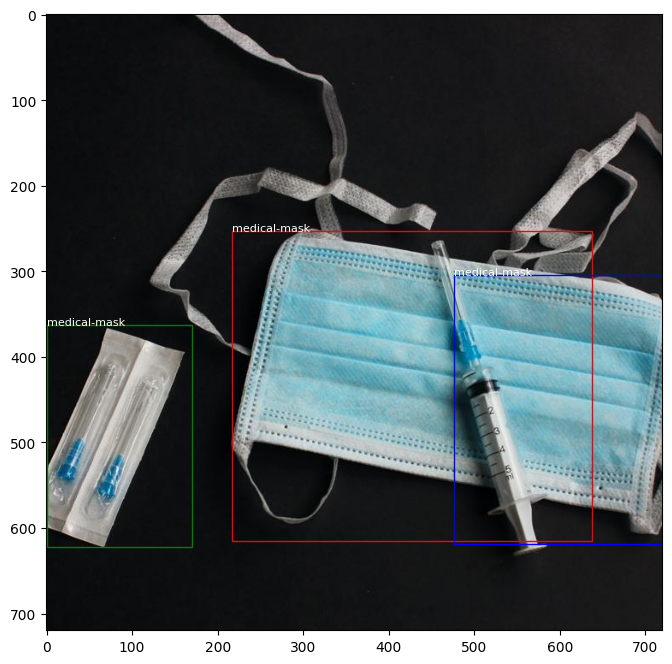


image 1/1 /Users/mellio/object-detection-face-mask/yolov8/../images-yolo/test/mm-28.jpg: 736x736 2 medical-masks, 92.4ms
Speed: 2.5ms preprocess, 92.4ms inference, 0.6ms postprocess per image at shape (1, 3, 736, 736)
medical-mask: 1.00 (r)
medical-mask: 1.00 (g)


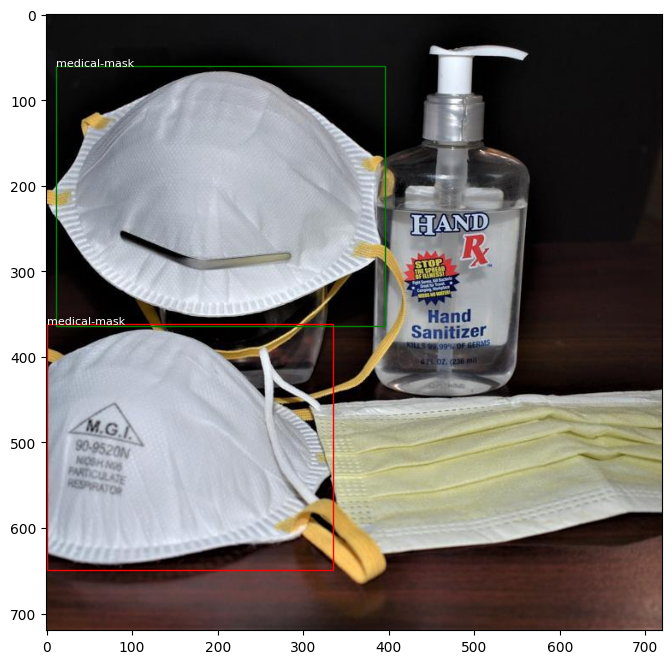

In [6]:
IMAGE_DIR = '../images-yolo/test'
image_paths = list_images(IMAGE_DIR)

for image_path in image_paths:
    fig, ax = plt.subplots(figsize=(8, 8))
    detect_objects(image_path, ax)
    plt.show()